In [12]:
import pandas as pd
name = ['bbbb','cccc','dddd','eeee']
father = [['aaaa'],['aaaa'],['aaaa'],['bbbb','cccc']]
da = pd.DataFrame()
da['table'] =name
da['father'] = father
da.to_csv('test.csv',index=0)

In [44]:
list(nodes.iloc[:,0])[:5]

['hbkdb.rtapam_dim_mcmgm_mchnt_white_list',
 'hbkdb.dtdtrs_dtl_achis_ma_cups',
 'hbkdb.stdtrs_bsl_risk_mchnt_kpi',
 'gl_hisdb.tbl_ibhis_fee_day_rslt',
 'hbkdb.stdtrs_bsl_udc_base_trans_mid']

In [12]:
import pickle
import pandas as pd
nodes = pd.read_csv('node.csv')
print(nodes.head())
edges = pd.read_csv('edges.csv')
edges.head()

                                         0
0  hbkdb.rtapam_dim_mcmgm_mchnt_white_list
1           hbkdb.dtdtrs_dtl_achis_ma_cups
2          hbkdb.stdtrs_bsl_risk_mchnt_kpi
3          gl_hisdb.tbl_ibhis_fee_day_rslt
4      hbkdb.stdtrs_bsl_udc_base_trans_mid


,0,1
0,hbkdb.tbl_hbk_dim_ins,hbkdb.stmtrs_mnt_logout
1,gl_hisdb.tbl_mchis_mgm_term_inf_all_seq,hbkdb.stdtrs_bsl_term_unique_total_all
2,hbkdb.stmtrs_dal_active_card_analyse_export,hbkdb.stmtrs_dal_active_card_analyse_info_export
3,hbkdb.stmtrs_scl_mchnt_stat,hbkdb.stmtrs_app_mchnt_detect_register_tmp
4,gl_hisdb.tbl_mchis_mgm_indirect_mchnt_inf,hbkdb.stdtrs_scl_mchnt_clean_base


In [13]:
new_edges = [(edges.ix[i,0],edges.ix[i,1]) for i in range(len(edges))]
new_edges[:3]

[('hbkdb.tbl_hbk_dim_ins', 'hbkdb.stmtrs_mnt_logout'),
 ('gl_hisdb.tbl_mchis_mgm_term_inf_all_seq',
  'hbkdb.stdtrs_bsl_term_unique_total_all'),
 ('hbkdb.stmtrs_dal_active_card_analyse_export',
  'hbkdb.stmtrs_dal_active_card_analyse_info_export')]

In [52]:
import pickle 

class StrToBytes:
    def __init__(self, fileobj):
        self.fileobj = fileobj
    def read(self, size):
        return self.fileobj.read(size).encode()
    def readline(self, size=-1):
        return self.fileobj.readline(size).encode()

f = open('./result/networkx.pickle','wb')
pickle.dump(DG,f)
f.close()

In [47]:
DG.number_of_nodes()

820

In [45]:
import networkx as nx 
import matplotlib.pyplot as plt 
%matplotlib inline
#有向图 
colors = [ 'green'] 
#edges = [(j,t.iloc[i,0]) for i in range(len(t)) for j in eval(t.iloc[i,1]) ]
#有向图 
DG = nx.DiGraph() 
#一次性添加多节点，输入的格式为列表 
DG.add_nodes_from(list(nodes.iloc[:,0])) 
#添加边，数据格式为列表 
DG.add_edges_from(new_edges) 
  
#作图，设置节点名显示,节点大小，节点颜色 
# nx.draw(DG,with_labels=True, node_size=50, node_color = colors,style='dashdot',font_size=3) 

# plt.savefig("pic.png") 


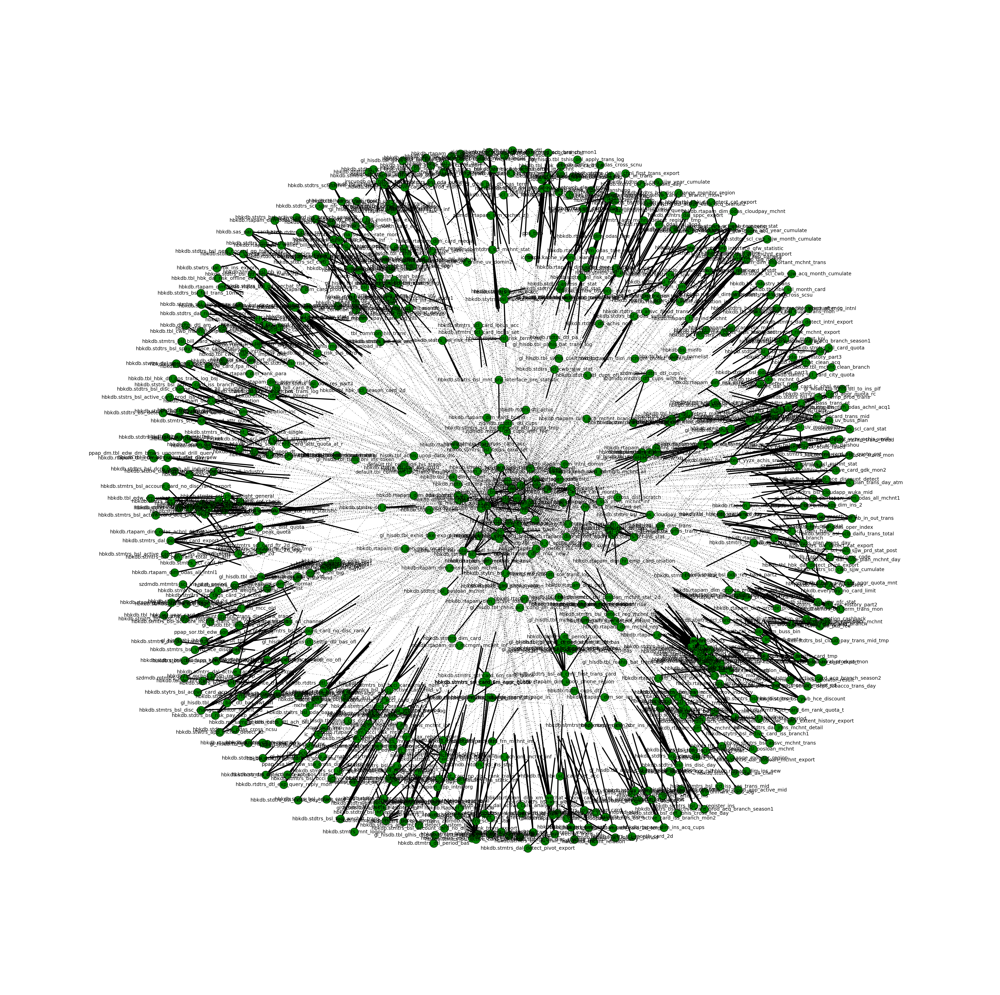

In [48]:

plt.figure(figsize=(50,50))
nx.draw(DG,with_labels=True, node_size=900, node_color = colors,style='dashdot',font_size=18) 

plt.savefig("pic.png") 

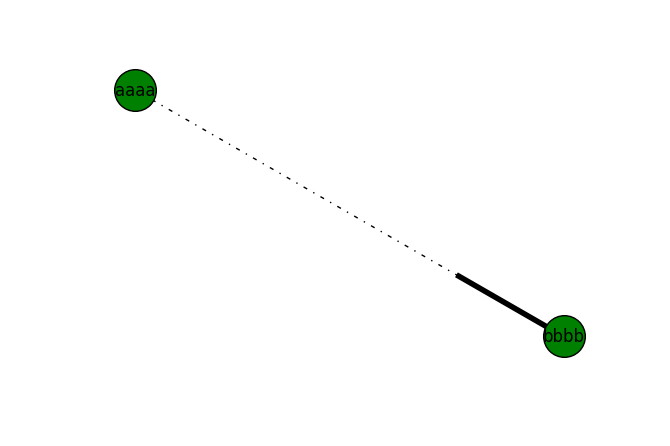

In [67]:
sub_graph = DG.subgraph(['aaaa','bbbb'])
nx.draw(sub_graph,with_labels=True, node_size=900, node_color = colors,style='dashdot')

In [49]:
import collections
def deep(g,pred,father):
    newPred = []
    for i in pred:
        for j in g.predecessors(i):
            if j not in father:
                father.append(j)
                newPred.append(j)
    return father,newPred

def sub_draw(g,table,deepth=100):
    #嵌套
    # pred是table的所有的父辈，succ是table的所有子辈
    pred = g.predecessors(table)
    a = pred
    succ = g.successors(table)
    father = []
    for i in pred:
        father.append(i)
    print('第 1 辈的依赖：',pred)
    for i in range(deepth-1):
        if len(pred)>0:
            
            father,pred = deep(g,pred,father)
            print('第',i+2,'辈的依赖：',pred)
    if len(set(father))!=len(father):
        print('依赖表中存在重复元素，说明有的依赖关系存在问题')
        print('出错的表是：',[item for item, count in collections.Counter(a).items() if count > 1])
    father.append(table)
    sub_graph = DG.subgraph(list(set(father)))
    nx.draw_circular(sub_graph,with_labels=True, node_size=300,node_color = colors,style='dashdot',font_size=8)
    plt.savefig("%s_%d.png" %(table,deepth)) 
    return a,succ,father

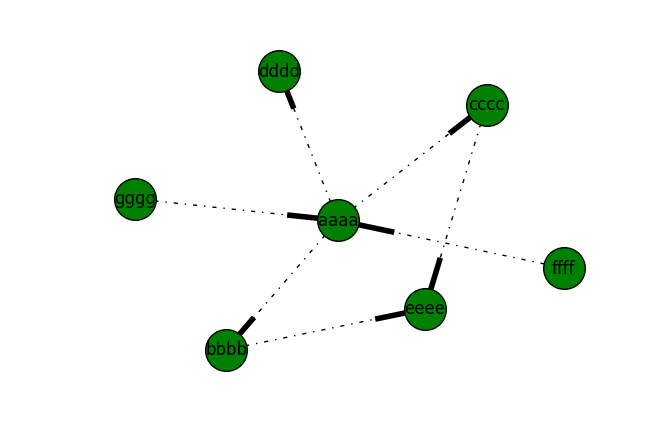

In [113]:
def update_net(nodes,edges):
    with open('networkx_1.pickle','rb') as f:
        DG = pickle.load(f)
    #一次性添加多节点，输入的格式为列表 
    DG.add_nodes_from(nodes) 
    #添加边，数据格式为列表 
    DG.add_edges_from(edges) 
    with open('networdx_new.pickle','wb') as f:
        pickle.dump(DG,f)
    nx.draw(DG,with_labels=True, node_size=900, node_color = colors,style='dashdot') 
    plt.savefig("pic_new.png")
    return DG
nodes = ['ffff','gggg']
edges = [('ffff','aaaa'),('gggg','aaaa')]
DG = update_net(nodes,edges)

In [32]:
from networkx.drawing.nx_agraph import graphviz_layout

第 1 辈的依赖： ['hbkdb.rtapam_dim_ins', 'hbkdb.rtapam_dim_mchnt', 'hbkdb.rtapam_dim_trans', 'hbkdb.dtdtrs_dtl_achis_ma_cups']
第 2 辈的依赖： ['gl_hisdb.tbl_qrhis_trans_flow', 'hbkdb.rtdtrs_dtl_achis', 'hbkdb.dtdtrs_dtl_cups', 'hbkdb.rtdtrs_dtl_achis_old', 'hbkdb.rtdtrs_dtl_cups_fee', 'hbkdb.rtdtrs_dtl_ma']
第 3 辈的依赖： ['hbkdb.dtdtrs_dtl_cups_mr', 'hbkdb.dtdtrs_dtl_cups_intermediate']


(['hbkdb.rtapam_dim_ins',
  'hbkdb.rtapam_dim_mchnt',
  'hbkdb.rtapam_dim_trans',
  'hbkdb.dtdtrs_dtl_achis_ma_cups'],
 ['hbkdb.stdtrs_bsl_disc_change_monitor_mchnt_cd',
  'hbkdb.stdtrs_bsl_udc_base_trans_mid',
  'hbkdb.stdtrs_bsl_disc_change_monitor_discount_mcc',
  'hbkdb.stdtrs_bsl_disc_change_monitor_all_industry',
  'hbkdb.stdtrs_bsl_buss_service_dept_tobacco_trans_day',
  'hbkdb.stdtrs_bsl_odas_cloudpay_trans_mid',
  'hbkdb.stmtrs_scl_mchnt_stat',
  'hbkdb.stdtrs_bsl_disc_change_monitor_region',
  'hbkdb.stdtrs_bsl_icd_iss_pos_trans_mid',
  'hbkdb.stdtrs_bsl_term_unique_detail',
  'hbkdb.stdtrs_bsl_buss_service_dept_mcc_trans_day',
  'hbkdb.stdtrs_bsl_dcm_graph_all_industry',
  'hbkdb.stmtrs_app_mchnt_detect_stat_day',
  'hbkdb.stdtrs_bsl_pos_trans_mid',
  'hbkdb.stdtrs_bsl_odas_cups_trans_mid',
  'hbkdb.stdtrs_bsl_dm_pbocic_notouch_cloud_trans_mid',
  'hbkdb.stdtrs_bsl_uchat_day_2018',
  'hbkdb.rtapam_dim_important_mchnt_trans',
  'hbkdb.stdtrs_scl_cwb_sjjw_acq_month_cumulate',


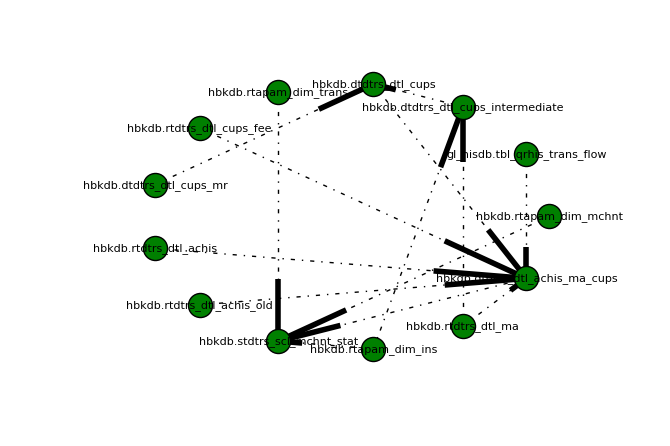

In [50]:
sub_draw(DG,'hbkdb.stdtrs_scl_mchnt_stat',3)